<a href="https://colab.research.google.com/github/drohal3/computer_vision/blob/main/notebooks/preprocessing_fisheye_for_yolo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PART 1: Preprocessing

## STEP 0: download raw images
Images in fisheye format are downloaded from GitHub repository.

In [30]:
import requests
import os

HOME = os.getcwd()
print("HOME", HOME)

images_arr=("lab.jpg", "cycling.jpg", "lake.jpg")

DOWNLOAD_URL = "https://raw.githubusercontent.com/drohal3/computer_vision/refs/heads/main/sources/images/fisheye_up_raw/"
IMG_DIRECTORY_RAW = "images/raw/"

os.makedirs(IMG_DIRECTORY_RAW, exist_ok=True)

for image in images_arr:
  url = f"{DOWNLOAD_URL}{image}"
  print(f"Downloading {url}")
  output_path = f"{IMG_DIRECTORY_RAW}{image}"
  response = requests.get(url)
  if response.status_code == 200:
    with open(output_path, "wb") as file:
        file.write(response.content)
    print(f"Image downloaded and saved as {output_path}")

HOME /content
Image downloaded and saved as images/raw/lab.jpg
Image downloaded and saved as images/raw/cycling.jpg
Image downloaded and saved as images/raw/lake.jpg


Image: images/raw/lab.jpg


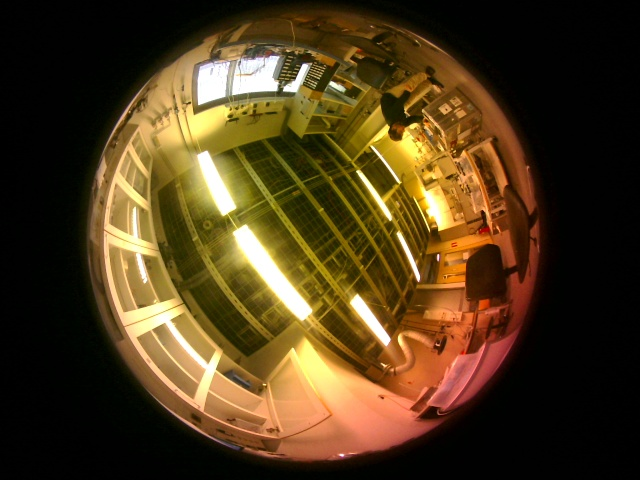

-
Image: images/raw/cycling.jpg


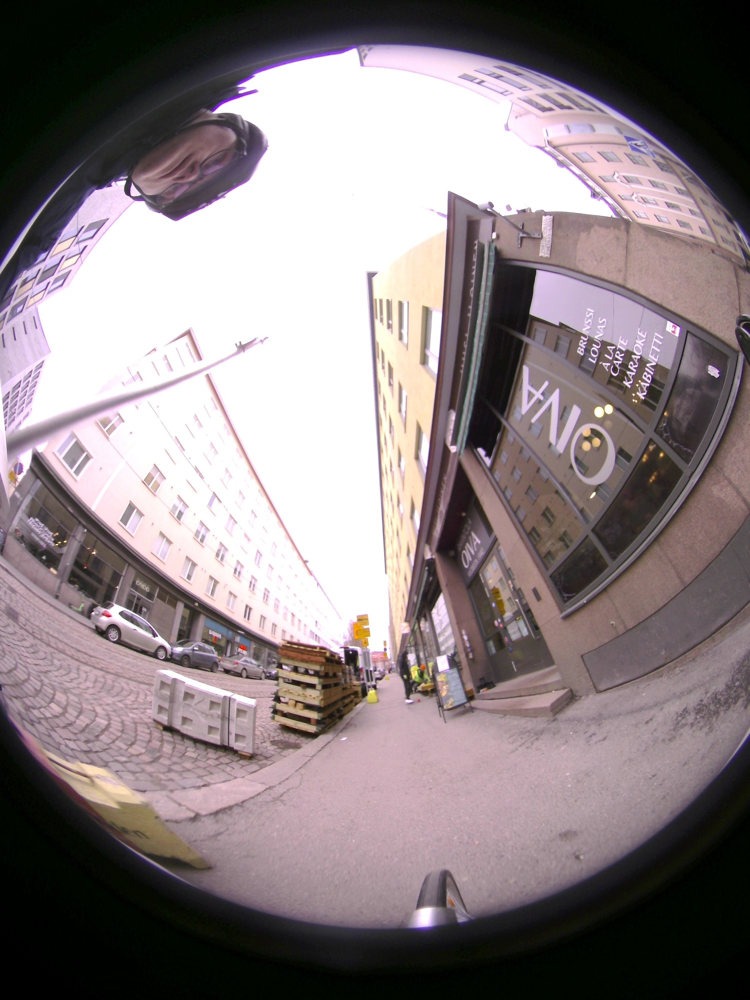

-
Image: images/raw/lake.jpg


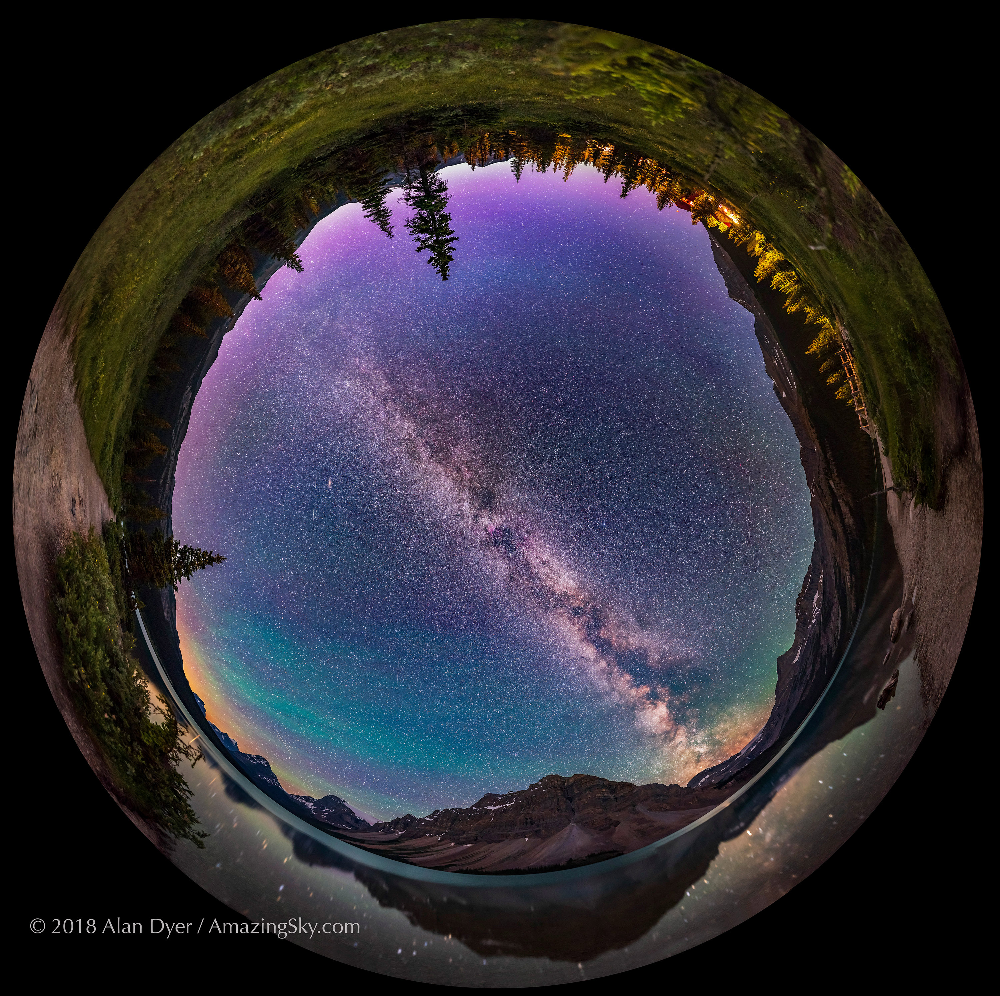

-


In [4]:
from IPython.display import display, Image

def display_images_by_directory(directory, images):
  for image in images_arr:
    image_path = f"{directory}{image}"
    print(f"Image: {image_path}")
    display(Image(filename=image_path, height=300))
    print("-")

display_images_by_directory(IMG_DIRECTORY_RAW, images_arr)

## STEP 1: Crop images
The raw images are cropped into square format to simplify further processing.

In [5]:
!pip install opencv-python

import cv2
import numpy as np

PADDING = 35
IMG_DIRECTORY_CROPPED = "images/cropped/"

os.makedirs(IMG_DIRECTORY_CROPPED, exist_ok=True)

for image in images_arr:
  image_path = f"{IMG_DIRECTORY_RAW}{image}"
  img = cv2.imread(image_path)
  raw_height, raw_width = img.shape[:2]
  result_edge = min(raw_height, raw_width) - PADDING
  print(f"image: {image_path} raw_width: {raw_width}, raw_eight: {raw_height}, edge: {result_edge}")
  x_to_crop = (raw_width - result_edge) // 2
  y_to_crop = (raw_height - result_edge) // 2
  sq_cropped_result = img[y_to_crop:-y_to_crop, x_to_crop:-x_to_crop]
  cropped_path = f"{IMG_DIRECTORY_CROPPED}{image}"
  print(f"Saving cropped image: {cropped_path}")
  cv2.imwrite(f"{IMG_DIRECTORY_CROPPED}{image}", sq_cropped_result)

image: images/raw/lab.jpg raw_width: 640, raw_eight: 480, edge: 445
Saving cropped image: images/cropped/lab.jpg
image: images/raw/cycling.jpg raw_width: 2448, raw_eight: 3264, edge: 2413
Saving cropped image: images/cropped/cycling.jpg
image: images/raw/lake.jpg raw_width: 3000, raw_eight: 2990, edge: 2955
Saving cropped image: images/cropped/lake.jpg


Image: images/cropped/lab.jpg


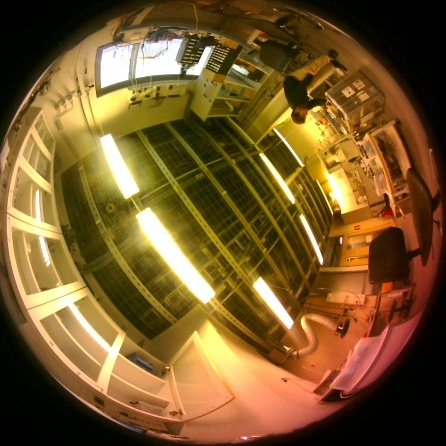

-
Image: images/cropped/cycling.jpg


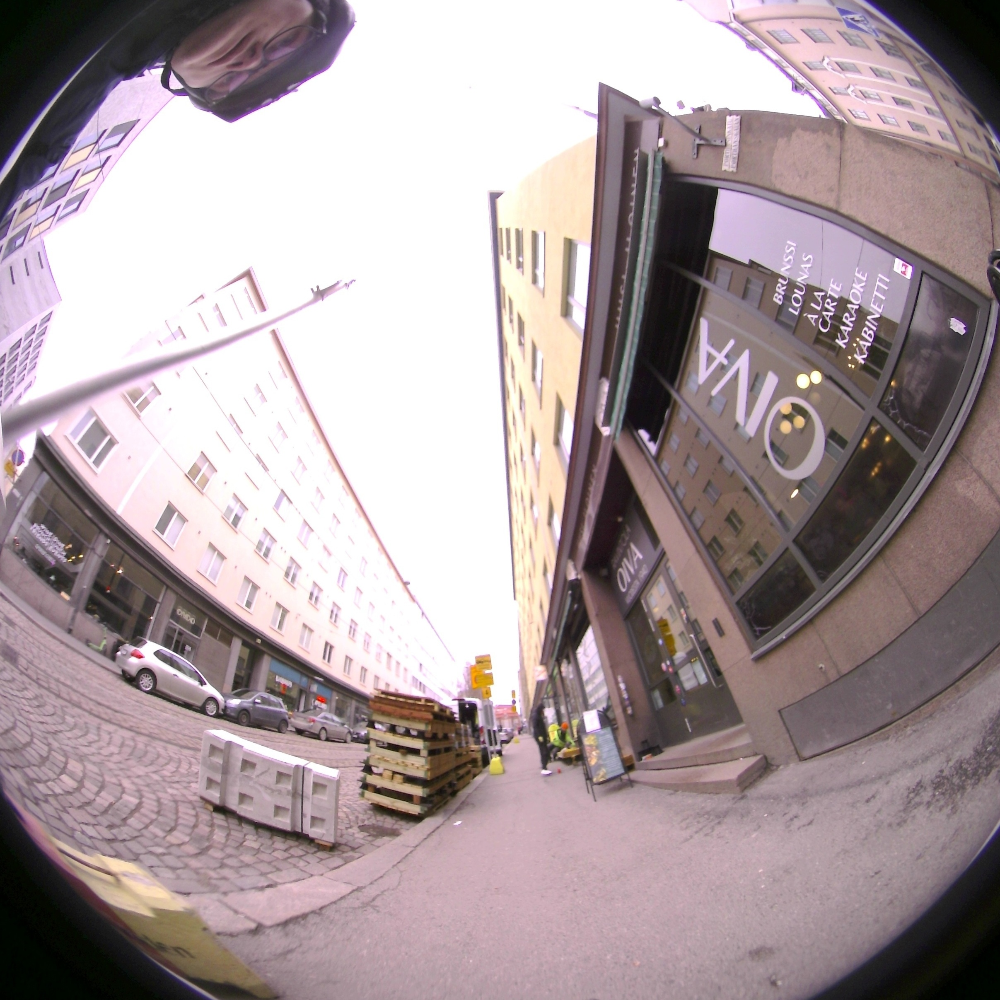

-
Image: images/cropped/lake.jpg


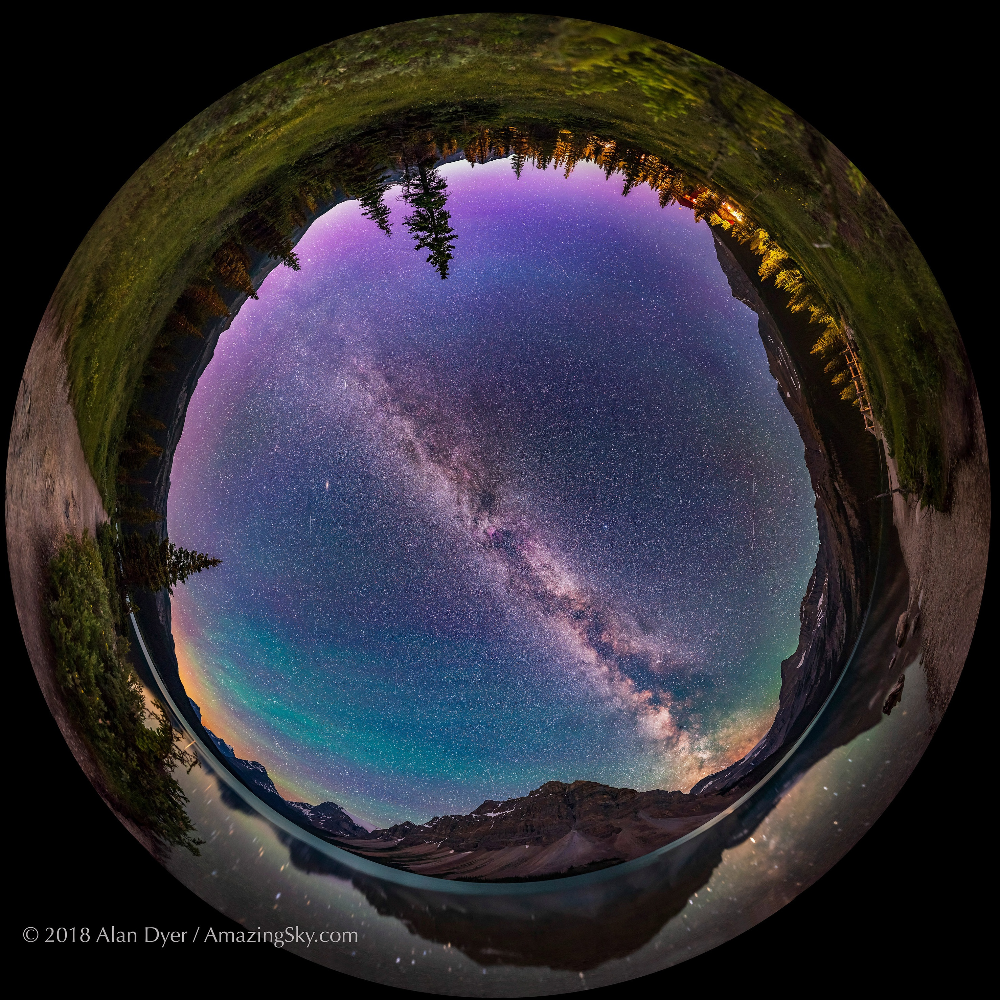

-


In [6]:
display_images_by_directory(IMG_DIRECTORY_CROPPED, images_arr)

## STEP 2: Create mask
a mask is created to be applied for each individual *image*

In [7]:
IMG_DIRECTORY_MASK = "images/mask/"

os.makedirs(IMG_DIRECTORY_MASK, exist_ok=True)

for image in images_arr:
  image_path = f"{IMG_DIRECTORY_CROPPED}{image}"
  img = cv2.imread(image_path)
  edge, _ = img.shape[:2]
  mask = np.zeros((edge, edge), dtype=np.uint8)
  center = (edge // 2, edge // 2)
  radius = edge // 2
  cv2.circle(mask, center, radius, (255), -1)  # -1 fills the circle
  mask_path = f"{IMG_DIRECTORY_MASK}{image}"
  print(f"Saving mask: {mask_path}")
  cv2.imwrite(mask_path, mask)

Saving mask: images/mask/lab.jpg
Saving mask: images/mask/cycling.jpg
Saving mask: images/mask/lake.jpg


Image: images/mask/lab.jpg


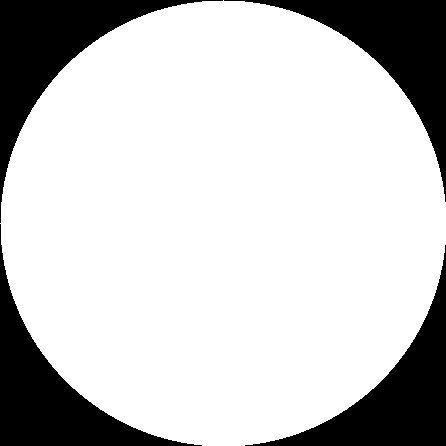

-
Image: images/mask/cycling.jpg


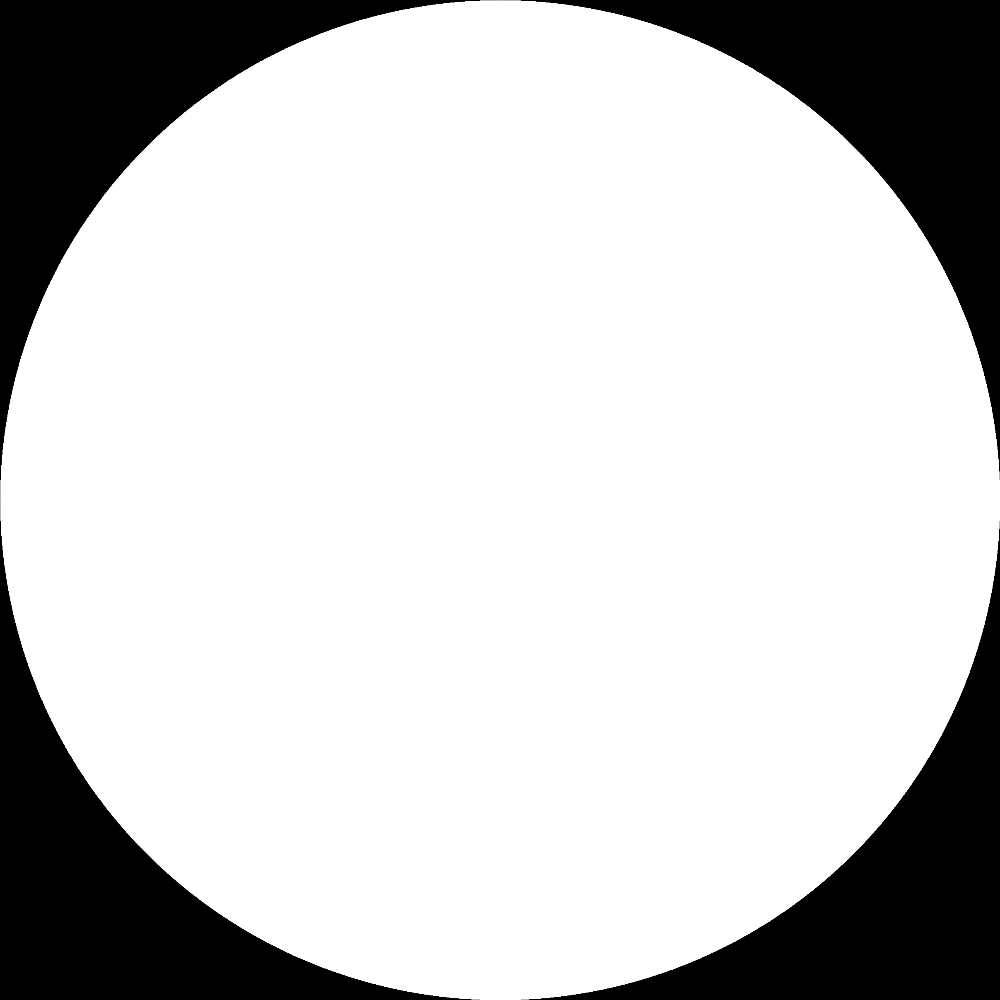

-
Image: images/mask/lake.jpg


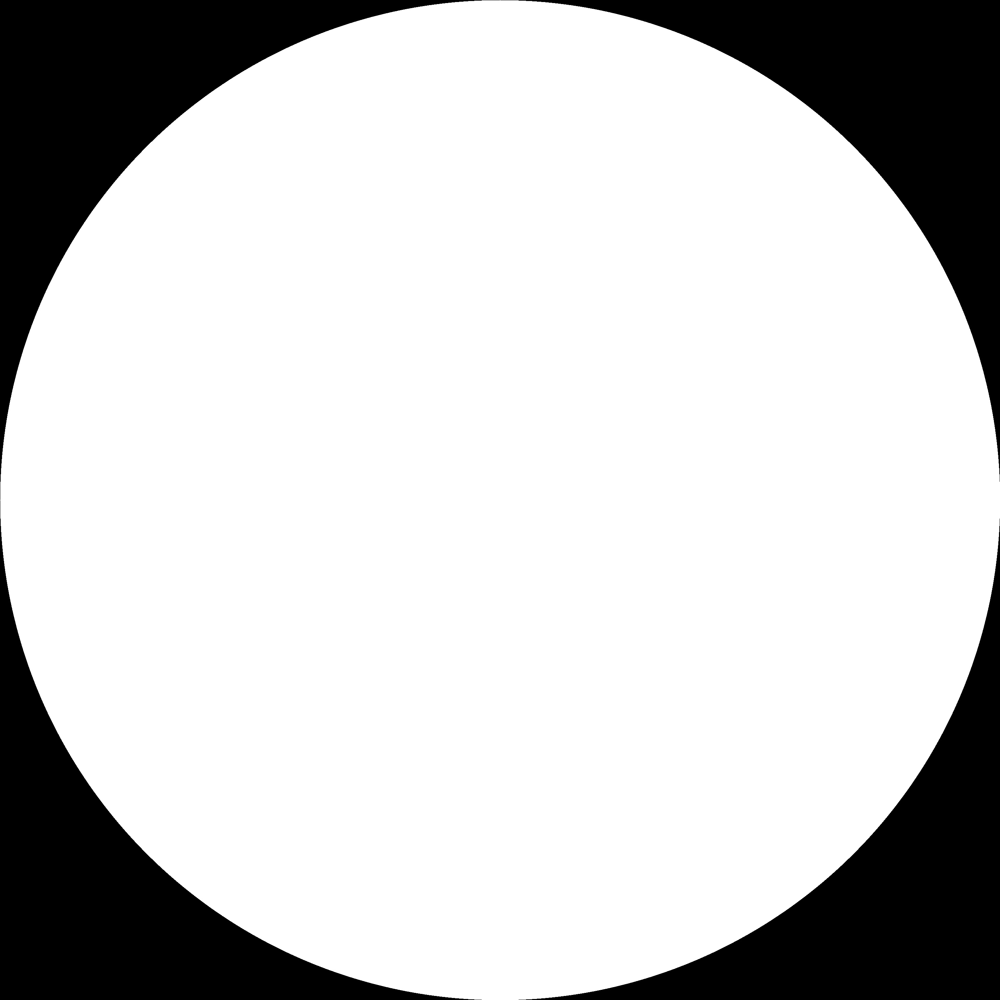

-


In [8]:
display_images_by_directory(IMG_DIRECTORY_MASK, images_arr)

## STEP 3: Apply mask
Mask is applied on the cropped image to simplify projections.

In [9]:
IMG_DIRECTORY_MASKED = "images/masked/"

os.makedirs(IMG_DIRECTORY_MASKED, exist_ok=True)

for image in images_arr:
  cropped_path = f"{IMG_DIRECTORY_CROPPED}{image}"
  mask_path = f"{IMG_DIRECTORY_MASK}{image}"
  cropped = cv2.imread(cropped_path)
  mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
  masked_path = f"{IMG_DIRECTORY_MASKED}{image}"
  masked_image = cv2.bitwise_and(cropped, cropped, mask=mask)
  print(f"Saving masked image: {masked_path}")
  cv2.imwrite(masked_path, masked_image)

Saving masked image: images/masked/lab.jpg
Saving masked image: images/masked/cycling.jpg
Saving masked image: images/masked/lake.jpg


Image: images/masked/lab.jpg


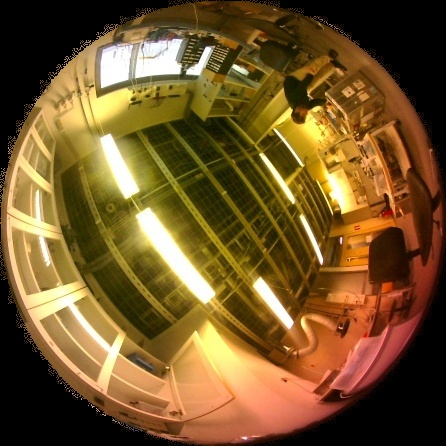

-
Image: images/masked/cycling.jpg


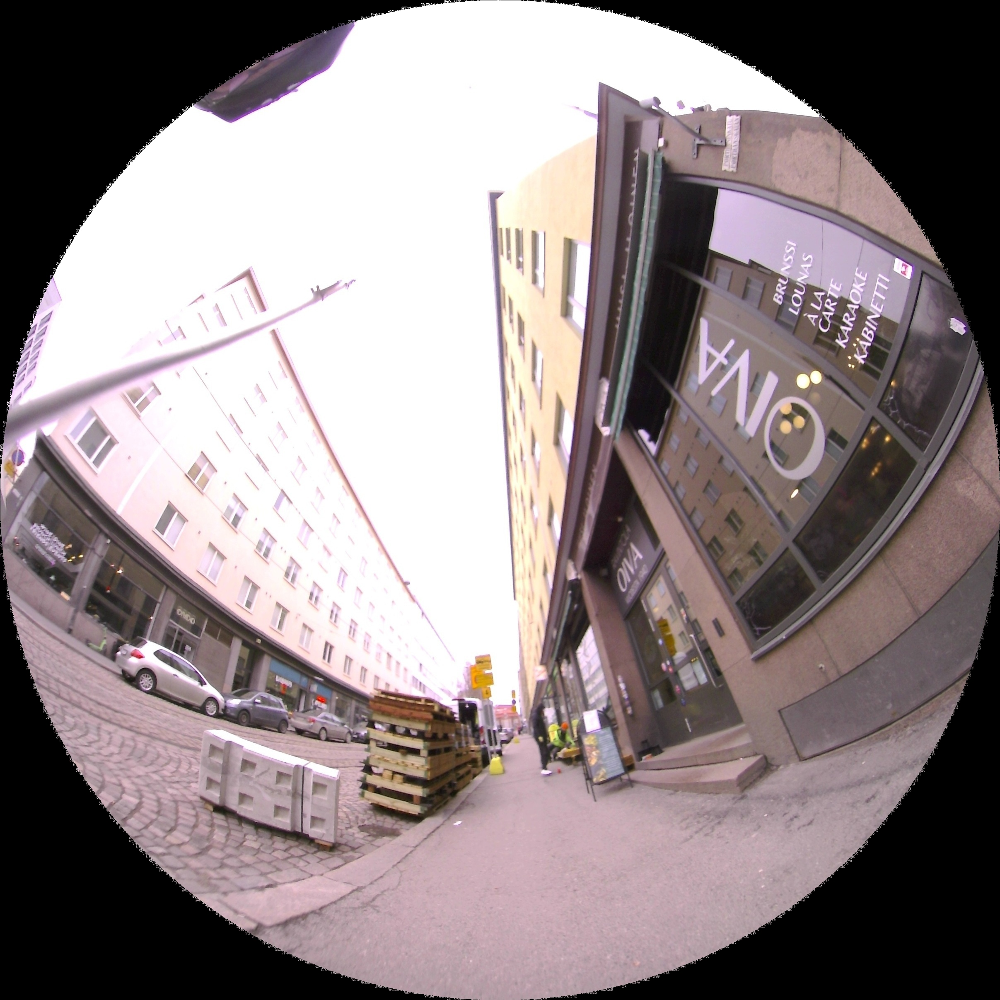

-
Image: images/masked/lake.jpg


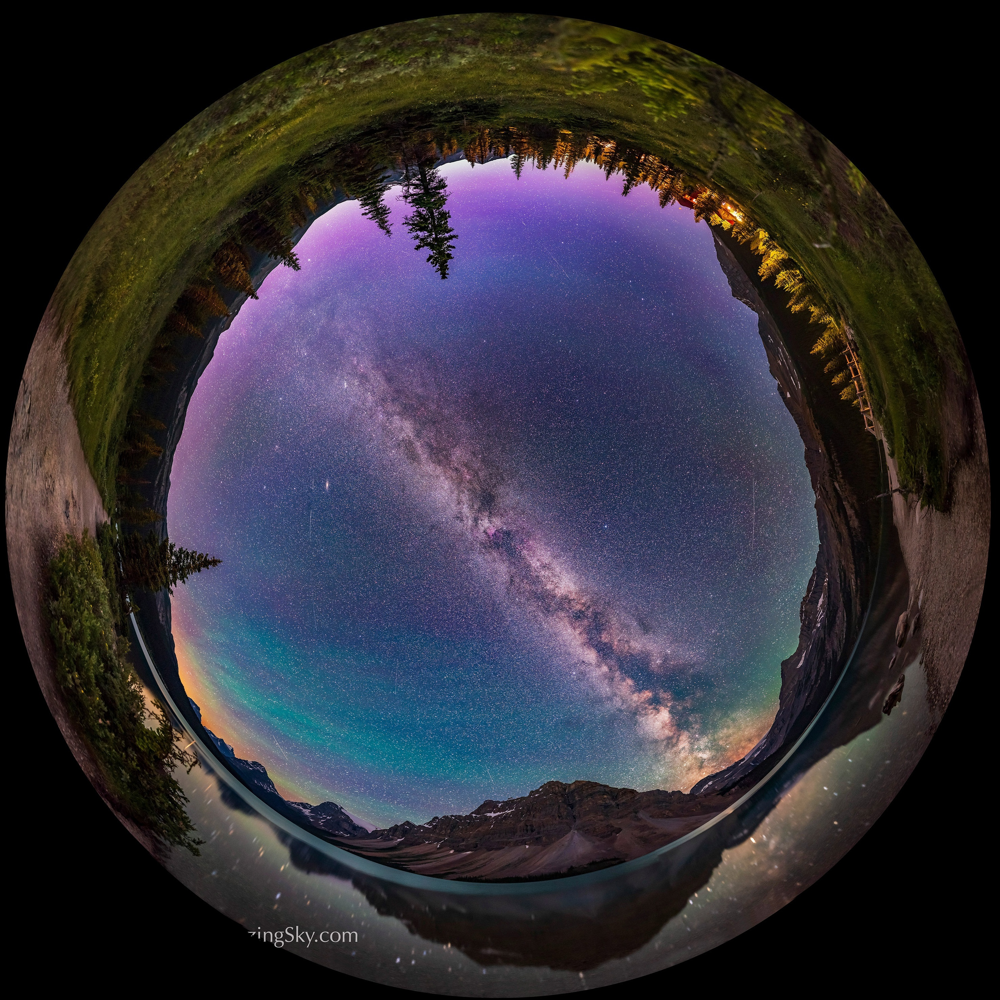

-


In [10]:
display_images_by_directory(IMG_DIRECTORY_MASKED, images_arr)

## STEP 4: Fisheye to equirectangular projection

In [11]:
def fisheye_to_equirectangular(image, output_width=1024, output_height=512, vertical_fov=280):
    # Load the fisheye image
    height, width = image.shape[:2]
    radius = min(width, height) // 2
    cx, cy = width // 2, height // 2

    # Output image
    equirect_image = np.zeros((output_height, output_width, 3), dtype=np.uint8)

    # Define spherical coordinates
    theta_range = np.linspace(0, 2 * np.pi, output_width)
    phi_range = np.linspace(0, np.deg2rad(vertical_fov), output_height)
    theta, phi = np.meshgrid(theta_range, phi_range)

    # Corrected mapping for fisheye to spherical coordinates
    r = phi / np.deg2rad(vertical_fov) * radius
    x = cx + r * np.cos(theta)
    y = cy + r * np.sin(theta)

    # Map coordinates to valid integers and clip out of bounds
    x = np.clip(x, 0, width - 1).astype(np.int32)
    y = np.clip(y, 0, height - 1).astype(np.int32)

    # Apply remapping to generate the equirectangular image
    equirect_image[:, :] = image[y, x]

    return equirect_image

IMG_DIRECTORY_EQUIRECT = "images/equirect/"
os.makedirs(IMG_DIRECTORY_EQUIRECT, exist_ok=True)

for image in images_arr:
  masked_path = f"{IMG_DIRECTORY_MASKED}{image}"
  equirect_path = f"{IMG_DIRECTORY_EQUIRECT}{image}"
  masked = cv2.imread(masked_path)
  equirect = fisheye_to_equirectangular(masked, 1024, 512, 200)
  print(f"Saving equirect image: {equirect_path}")
  cv2.imwrite(equirect_path, equirect)

Saving equirect image: images/equirect/lab.jpg
Saving equirect image: images/equirect/cycling.jpg
Saving equirect image: images/equirect/lake.jpg


Image: images/equirect/lab.jpg


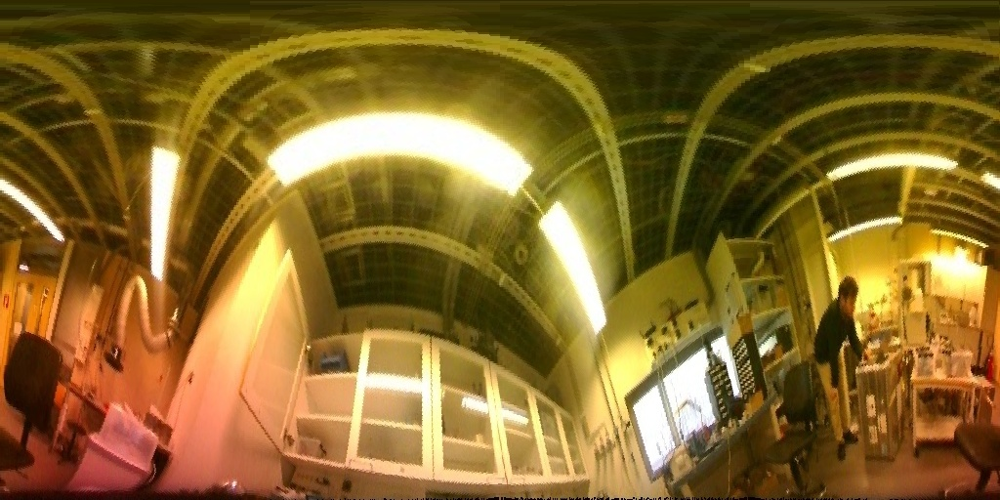

-
Image: images/equirect/cycling.jpg


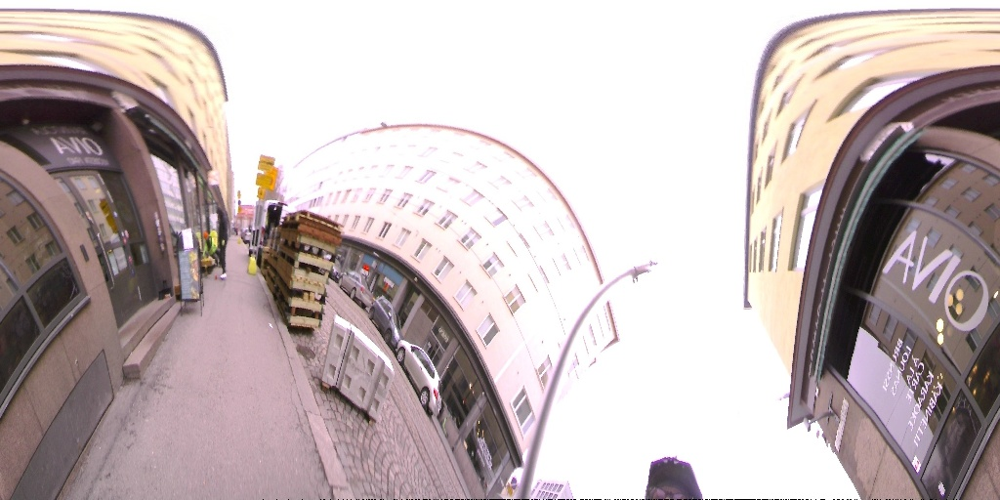

-
Image: images/equirect/lake.jpg


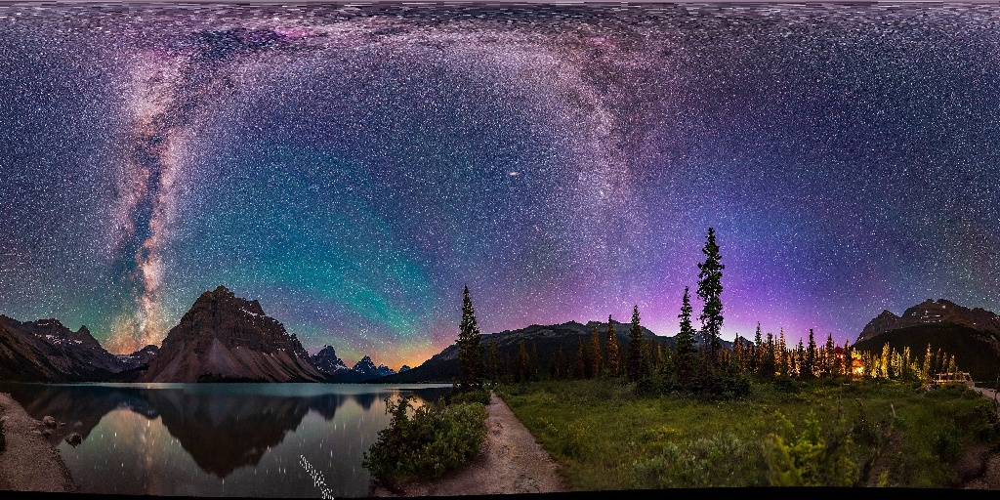

-


In [12]:
display_images_by_directory(IMG_DIRECTORY_EQUIRECT, images_arr)

# PART 2: YOLO

Let's make sure that we have access to GPU. We can use nvidia-smi command to do that. In case of any problems navigate to Edit -> Notebook settings -> Hardware accelerator, set it to GPU, and then click Save.

In [13]:
!nvidia-smi

Mon May 19 08:37:21 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   38C    P8             11W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [14]:
!pip install ultralytics -q

In [44]:
import ultralytics

IMG_DIRECTORY_YOLO_RESULT = "images/yolo_result/"

os.makedirs(IMG_DIRECTORY_YOLO_RESULT, exist_ok=True)

model = ultralytics.YOLO('yolov8n.pt')

for image in images_arr:
  equirect_path = f"{IMG_DIRECTORY_EQUIRECT}{image}"
  results = model.predict(source=equirect_path, conf=0.25)
  result_path = f"{IMG_DIRECTORY_YOLO_RESULT}{image}"
  results[0].save(result_path)


image 1/1 /content/images/equirect/lab.jpg: 320x640 1 person, 7.5ms
Speed: 1.8ms preprocess, 7.5ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 640)

image 1/1 /content/images/equirect/cycling.jpg: 320x640 1 person, 1 truck, 8.7ms
Speed: 1.7ms preprocess, 8.7ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 640)

image 1/1 /content/images/equirect/lake.jpg: 320x640 (no detections), 6.8ms
Speed: 1.8ms preprocess, 6.8ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 640)


Image: images/yolo_result/lab.jpg


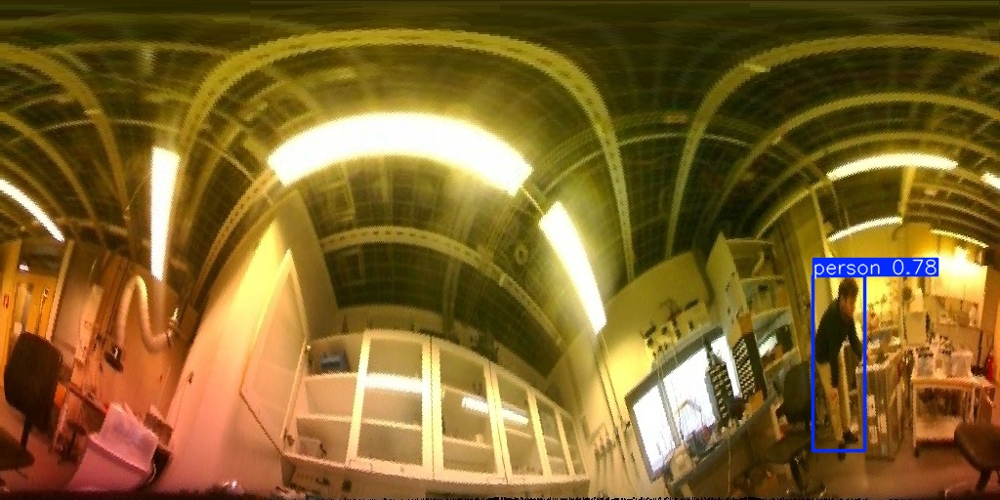

-
Image: images/yolo_result/cycling.jpg


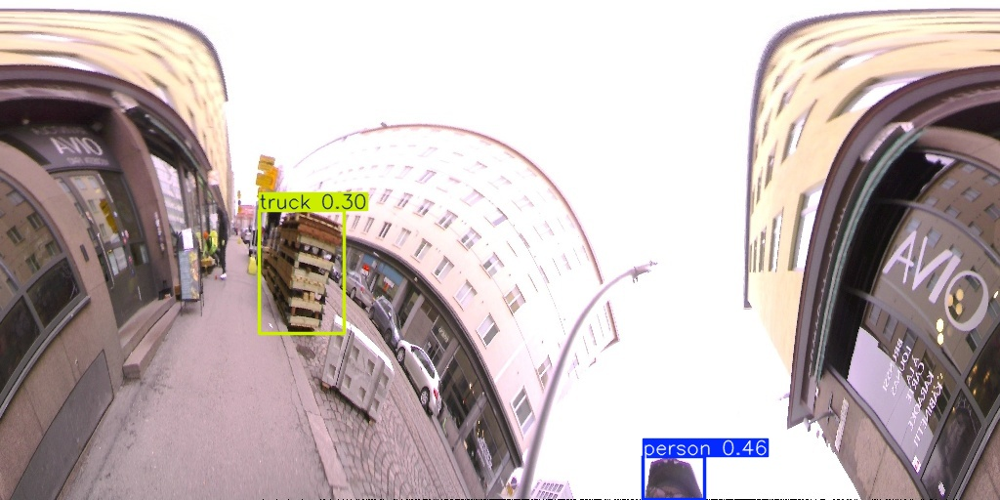

-
Image: images/yolo_result/lake.jpg


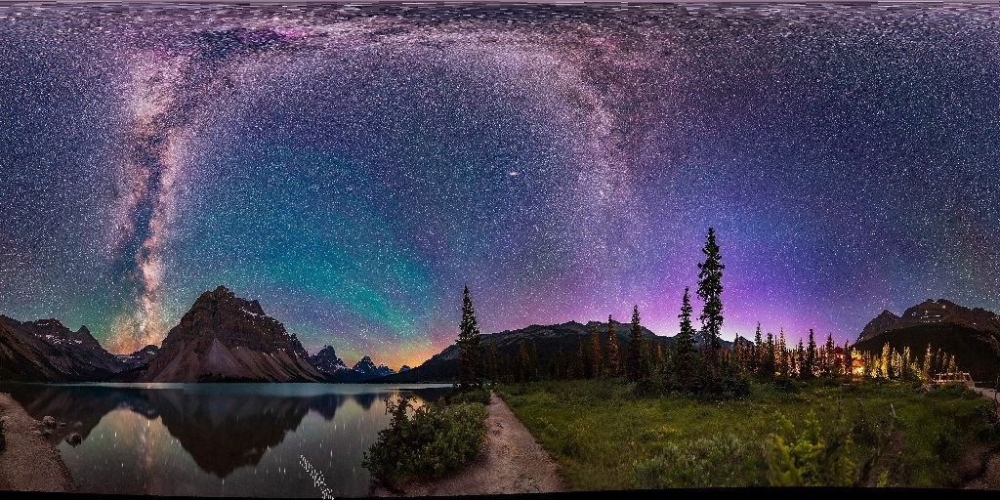

-


In [45]:
display_images_by_directory(IMG_DIRECTORY_YOLO_RESULT, images_arr)